In [2]:
%pip install folium pandas shapely geopandas

   ---------------------------------------- 0.0/1.7 MB ? eta -:--:--
   ------------------------ --------------- 1.0/1.7 MB 5.7 MB/s eta 0:00:01
   ---------------------------------------- 1.7/1.7 MB 4.9 MB/s eta 0:00:00
   ---------------------------------------- 0.0/19.2 MB ? eta -:--:--
   -- ------------------------------------- 1.0/19.2 MB 5.7 MB/s eta 0:00:04
   ---- ----------------------------------- 2.1/19.2 MB 5.6 MB/s eta 0:00:04
   ------- -------------------------------- 3.4/19.2 MB 5.7 MB/s eta 0:00:03
   --------- ------------------------------ 4.7/19.2 MB 5.8 MB/s eta 0:00:03
   ------------ --------------------------- 6.0/19.2 MB 5.9 MB/s eta 0:00:03
   -------------- ------------------------- 7.1/19.2 MB 5.8 MB/s eta 0:00:03
   ----------------- ---------------------- 8.4/19.2 MB 5.9 MB/s eta 0:00:02
   ------------------- -------------------- 9.4/19.2 MB 5.9 MB/s eta 0:00:02
   ---------------------- ----------------- 10.7/19.2 MB 5.9 MB/s eta 0:00:02
   ------------

In [ ]:
import folium
from folium.plugins import Draw
import pandas as pd
import geopandas as gpd

## **export 하는 html 문서 생성**

In [49]:
# 데이터 읽기
nodes_gdf = pd.read_csv("modified_data/new_nodes.csv")
edges_gdf = gpd.read_file("modified_data/new_edges.geojson")

In [50]:
edges_gdf.head(5)

,u,v,key,length,road,park,river,mountain,geometry
0,287288045,1943131901,0,38.805000,1,0,0,0,"LINESTRING (127.02953 37.58266, 127.0292 37.58..."
1,287288045,1943131877,0,39.840708,1,0,0,0,"LINESTRING (127.02953 37.58266, 127.0296 37.5823)"
2,287288045,3964387739,0,24.542441,1,0,0,0,"LINESTRING (127.02953 37.58266, 127.0297 37.58..."
3,287710021,7068765358,0,4.968920,1,0,0,0,"LINESTRING (127.04522 37.57995, 127.0452 37.57..."
4,287710021,10017702402,0,65.032964,1,0,0,0,"LINESTRING (127.04522 37.57995, 127.04536 37.5..."


In [8]:
# 지도 생성 및 표시
center_lat = nodes_gdf["lat"].mean()
center_lon = nodes_gdf["lon"].mean()
m = folium.Map(location=[center_lat, center_lon], zoom_start=14)

# Esri.WorldImagery 스타일 적용
folium.TileLayer(
    tiles='https://server.arcgisonline.com/ArcGIS/rest/services/World_Imagery/MapServer/tile/{z}/{y}/{x}',
    attr='Tiles © Esri — Source: Esri, i-cubed, USDA, USGS, AEX, GeoEye, '
         'Getmapping, Aerogrid, IGN, IGP, UPR-EGP, and the GIS User Community',
    name='Esri.WorldImagery',
    overlay=False,
    control=True
).add_to(m)

# 노드 마커 표시
for _, row in nodes_gdf.iterrows():
    folium.CircleMarker(
        location=[row["lat"], row["lon"]],
        radius=2,
        color="#ff6b6b",
        fill=True,
        fill_opacity=0.8
    ).add_to(m)

# 엣지 표시
available_fields = list(edges_gdf.columns)
tooltip_fields = [f for f in ["name", "highway", "length"] if f in available_fields]

folium.GeoJson(
    data=edges_gdf.to_json(),
    name="walk_edges",
    style_function=lambda _feat: {"color": "#3388ff", "weight": 3, "opacity": 0.9},
    tooltip=folium.features.GeoJsonTooltip(fields=tooltip_fields, aliases=tooltip_fields, sticky=False)
).add_to(m)

# Draw 플러그인 추가
draw = Draw(
    export=True,
    filename='selected_area.geojson',
    position='topleft',
    draw_options={
        'polygon': True,
        'rectangle': True,
        'polyline': False,
        'circle': False,
        'marker': False,
        'circlemarker': False
    },
    edit_options={'edit': False}
)
draw.add_to(m)

# 지도 HTML로 저장
m.save("select_nodes_map.html")
m

## **선택된 영역의 target tag를 1로 변경**

In [83]:
import folium
from folium.plugins import Draw
import pandas as pd
from shapely.geometry import Point, shape
import json
import geopandas as gpd

In [84]:
# 데이터 읽기
nodes_gdf = pd.read_csv("modified_data/new_nodes.csv")
edges_gdf = gpd.read_file("modified_data/new_edges.geojson")

In [52]:
# 다운로드 된 selected_area.geojson 파일 위치 변경
import os
import shutil

# 현재 노트북이 실행 중인 폴더 (루트 폴더)
root_dir = os.getcwd()

# 브라우저 기본 다운로드 폴더
download_dir = os.path.expanduser("~/Downloads")

# 원본 파일 경로
src_file = os.path.join(download_dir, "selected_area.geojson")

# 이동할 경로 (루트 폴더 안)
dst_file = os.path.join(root_dir, "selected_area.geojson")

# 파일이 존재할 때만 이동
if os.path.exists(src_file):
    shutil.move(src_file, dst_file)
    print(f"✅ 파일 이동 완료: {dst_file}")
else:
    print("❌ 다운로드 폴더에서 selected_area.geojson을 찾을 수 없습니다.")

❌ 다운로드 폴더에서 selected_area.geojson을 찾을 수 없습니다.


In [54]:
# selected_area.geojson 파일 백업
from datetime import datetime

# 백업 폴더 경로
backup_dir = os.path.join(root_dir, "backup_data")

# 만약 기존 파일이 있으면 백업
if os.path.exists(dst_file):
    # 파일의 마지막 수정 시간 가져오기
    mtime = os.path.getmtime(dst_file)
    timestamp = datetime.fromtimestamp(mtime).strftime("%Y%m%d_%H%M")
    
    # 백업 파일명 생성
    backup_file = os.path.join(
        backup_dir, f"selected_area_{timestamp}.geojson"
    )
    
    shutil.copy2(dst_file, backup_file)
    print(f"💾 기존 파일을 백업했습니다: {backup_file}")
else:
    print("selected_area.geojson 파일이 존재하지 않습니다.")

💾 기존 파일을 백업했습니다: C:\Users\rlatj\Programming_Workspace\Hanyang_Programming\Hackerthon\DataProcess\backup_data\selected_area_20250815_1943.geojson


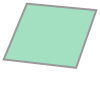

In [85]:
# 저장된 selected_area.geojson 파일 불러오기
with open("selected_area.geojson") as f:
    geojson_data = json.load(f)

polygon = shape(geojson_data['features'][0]['geometry'])
polygon

In [89]:
# 영역 안에 포함된 노드 필터링
node_mask = nodes_gdf.apply(lambda r: polygon.contains(Point(r['lon'], r['lat'])), axis=1)
selected_nodes = nodes_gdf[node_mask]

In [90]:
# 타겟 태그의 값 1로 변경
target_tag = 'mountain' # road, park, river, mountain
for _, row in selected_nodes.iterrows():
    # node의 target_tag 변경
    nodes_gdf.loc[nodes_gdf['osmid'] == row['osmid'], target_tag] = 1
    nodes_gdf.loc[nodes_gdf['osmid'] == row['osmid'], 'road'] = 0

    # edge의 target_tag 변경
    edge_mask = (edges_gdf['u'] == row['osmid']) | (edges_gdf['v'] == row['osmid'])
    edges_gdf.loc[edge_mask, target_tag] = 1
    edges_gdf.loc[edge_mask, 'road'] = 0

In [91]:
nodes_gdf[nodes_gdf[target_tag] == 1]

,osmid,lat,lon,road,park,river,mountain
690,3807500734,37.573126,127.058611,0,0,0,1
691,3807500735,37.573135,127.058299,0,0,0,1
692,3807500736,37.573149,127.057990,0,0,0,1
695,3807500744,37.573289,127.059300,0,0,0,1
697,3807500747,37.573310,127.058637,0,0,0,1
...,...,...,...,...,...,...,...
6916,12435792962,37.572973,127.059043,0,0,0,1
6917,12435792963,37.572965,127.059489,0,0,0,1
6946,12449619231,37.574890,127.057655,0,0,0,1
6980,12450959596,37.572369,127.059293,0,0,0,1


In [92]:
edges_gdf[edges_gdf[target_tag] == 1]

,u,v,key,length,road,park,river,mountain,geometry
2083,3807500734,3807500735,0,27.498968,0,0,0,1,"LINESTRING (127.05861 37.57313, 127.0583 37.57..."
2084,3807500734,12435792947,0,16.148145,0,0,0,1,"LINESTRING (127.05861 37.57313, 127.05861 37.5..."
2085,3807500734,3807500747,0,20.598857,0,0,0,1,"LINESTRING (127.05861 37.57313, 127.05864 37.5..."
2086,3807500735,12435792946,0,16.574650,0,0,0,1,"LINESTRING (127.0583 37.57314, 127.05829 37.57..."
2087,3807500735,3807500734,0,27.498968,0,0,0,1,"LINESTRING (127.0583 37.57314, 127.05861 37.57..."
...,...,...,...,...,...,...,...,...,...
19654,12450959596,3832416150,0,5.180778,0,0,0,1,"LINESTRING (127.05929 37.57237, 127.05935 37.5..."
19655,12450959596,3832416144,0,67.719805,0,0,0,1,"LINESTRING (127.05929 37.57237, 127.05861 37.5..."
19656,12450959596,12435792934,0,46.051228,0,0,0,1,"LINESTRING (127.05929 37.57237, 127.05929 37.5..."
21545,13042963176,13042963184,0,31.755048,0,0,0,1,"LINESTRING (127.05812 37.57661, 127.05834 37.5..."


## **선택된 영역만 지도에 표시**

In [62]:
# 선택된 노드와 엣지만 표시
selected_center_lat = selected_nodes["lat"].mean()
selected_center_lon = selected_nodes["lon"].mean()
m = folium.Map(location=[selected_center_lat, selected_center_lon], zoom_start=16)

# Esri.WorldImagery 스타일 적용
folium.TileLayer(
    tiles='https://server.arcgisonline.com/ArcGIS/rest/services/World_Imagery/MapServer/tile/{z}/{y}/{x}',
    attr='Tiles © Esri — Source: Esri, i-cubed, USDA, USGS, AEX, GeoEye, '
         'Getmapping, Aerogrid, IGN, IGP, UPR-EGP, and the GIS User Community',
    name='Esri.WorldImagery',
    overlay=False,
    control=True
).add_to(m)

# 노드 표시
for _, row in selected_nodes.iterrows():
    folium.CircleMarker(
        location=[row["lat"], row["lon"]],
        radius=2,
        color="#ff6b6b",
        fill=True,
        fill_opacity=0.8
    ).add_to(m)

# 엣지 표시
folium.GeoJson(
    data=selected_edges.to_json(),
    name="walk_edges",
    style_function=lambda _feat: {"color": "#3388ff", "weight": 3, "opacity": 0.9},
    tooltip=folium.features.GeoJsonTooltip(fields=tooltip_fields, aliases=tooltip_fields, sticky=False)
).add_to(m)
m

In [ ]:
# 기본 설정(한 번만 실행)
import folium
import pandas as pd
from shapely.geometry import Point, shape
import json
import geopandas as gpd

# 데이터 읽기
nodes_gdf = pd.read_csv("modified_data/new_nodes.csv")
edges_gdf = gpd.read_file("modified_data/new_edges.geojson")

## **최종 코드(export -> 실행 반복)**

In [ ]:
# selected_area 기반으로 노드 및 엣지 추출
import os
import shutil

# 현재 노트북이 실행 중인 폴더 (루트 폴더)
root_dir = os.getcwd()

# 브라우저 기본 다운로드 폴더
download_dir = os.path.expanduser("~/Downloads")

# 원본 파일 경로
src_file = os.path.join(download_dir, "selected_area.geojson")

# 이동할 경로 (루트 폴더 안)
dst_file = os.path.join(root_dir, "selected_area.geojson")

# 파일이 존재할 때만 이동
if os.path.exists(src_file):
    shutil.move(src_file, dst_file)
    print(f"✅ 파일 이동 완료: {dst_file}")
else:
    print("❌ 다운로드 폴더에서 selected_area.geojson을 찾을 수 없습니다.")

# selected_area.geojson 파일 백업
from datetime import datetime

# 백업 폴더 경로
backup_dir = os.path.join(root_dir, "backup_data")

# 만약 기존 파일이 있으면 백업
if os.path.exists(dst_file):
    # 파일의 마지막 수정 시간 가져오기
    mtime = os.path.getmtime(dst_file)
    timestamp = datetime.fromtimestamp(mtime).strftime("%Y%m%d_%H%M")
    
    # 백업 파일명 생성
    backup_file = os.path.join(
        backup_dir, f"selected_area_{timestamp}.geojson"
    )
    
    shutil.copy2(dst_file, backup_file)
    print(f"💾 기존 파일을 백업했습니다: {backup_file}")
else:
    print("selected_area.geojson 파일이 존재하지 않습니다.")

# 저장된 selected_area.geojson 파일 불러오기
with open("selected_area.geojson") as f:
    geojson_data = json.load(f)

polygon = shape(geojson_data['features'][0]['geometry'])

# 영역 안에 포함된 노드 필터링
node_mask = nodes_gdf.apply(lambda r: polygon.contains(Point(r['lon'], r['lat'])), axis=1)
selected_nodes = nodes_gdf[node_mask]

In [82]:
# 선택된 노드와 엣지 확인
selected_center_lat = selected_nodes["lat"].mean()
selected_center_lon = selected_nodes["lon"].mean()
m = folium.Map(location=[selected_center_lat, selected_center_lon], zoom_start=16)

# Esri.WorldImagery 스타일 적용
folium.TileLayer(
    tiles='https://server.arcgisonline.com/ArcGIS/rest/services/World_Imagery/MapServer/tile/{z}/{y}/{x}',
    attr='Tiles © Esri — Source: Esri, i-cubed, USDA, USGS, AEX, GeoEye, '
         'Getmapping, Aerogrid, IGN, IGP, UPR-EGP, and the GIS User Community',
    name='Esri.WorldImagery',
    overlay=False,
    control=True
).add_to(m)

# 노드 표시
for _, row in selected_nodes.iterrows():
    folium.CircleMarker(
        location=[row["lat"], row["lon"]],
        radius=2,
        color="#ff6b6b",
        fill=True,
        fill_opacity=0.8
    ).add_to(m)

# 엣지 표시
folium.GeoJson(
    data=selected_edges.to_json(),
    name="walk_edges",
    style_function=lambda _feat: {"color": "#3388ff", "weight": 3, "opacity": 0.9},
    tooltip=folium.features.GeoJsonTooltip(fields=tooltip_fields, aliases=tooltip_fields, sticky=False)
).add_to(m)
m

In [ ]:
# 타겟 태그 값 1로 변경
target_tag = 'mountain' # road, park, river, mountain
for _, row in selected_nodes.iterrows():
    # node의 target_tag 변경
    nodes_gdf.loc[nodes_gdf['osmid'] == row['osmid'], target_tag] = 1
    nodes_gdf.loc[nodes_gdf['osmid'] == row['osmid'], 'road'] = 0

    # edge의 target_tag 변경
    edge_mask = (edges_gdf['u'] == row['osmid']) | (edges_gdf['v'] == row['osmid'])
    edges_gdf.loc[edge_mask, target_tag] = 1
    edges_gdf.loc[edge_mask, 'road'] = 0